# Case Study: Neural Style Transfer
Note that for the training of the model, this Notebook is run in Google Colab to make use of the GPU processors.

<a name='1'></a>
## 1 - Packages

In [1]:
import os
import sys
import scipy.io
import scipy.misc
import matplotlib.pyplot as plt
from matplotlib.pyplot import imshow
from PIL import Image
import numpy as np
import tensorflow as tf
import pprint
%matplotlib inline

<a name='2'></a>
## 2 - Problem Statement

The goal of this notebook is to use Neural Style Transfer (NST) to combine the Louvre museum in Paris with the impressionist style of Claude Monet. NST combines two images, namely: a <strong>"content" image (C)</strong> (Louvre museum) and a <strong>"style" image (S)</strong> (impressionist style of Monet), to create a <strong>"generated" image (G)</strong>. The generated image G combines the "content" of the image C with the "style" of image S.

<img src="Generated_Image.png" style="width:750px;height:200px;">

<a name='3'></a>
## 3 - Transfer Learning

To generate the image of the Louvre with a Monet style, a previously trained convolutional network will be used. The idea of using a network trained on a different task and applying it to a new task is called transfer learning. In this case, a VGG network will be used, published by the Visual Geometry Group at University of Oxford. Specifically, a 19-layer version of the VGG network will be used, named VGG-19. This model has already been trained on the very large ImageNet database, and has learned to recognize a variety of low level features (at the shallower layers) and high level features (at the deeper layers).

In [2]:
tf.random.set_seed(272)
pp = pprint.PrettyPrinter(indent=4)
img_size = 400
vgg = tf.keras.applications.VGG19(include_top=False,
                                  input_shape=(img_size, img_size, 3),
                                  weights='imagenet')

vgg.trainable = False
pp.pprint(vgg)

80134624/80134624 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step
<Functional name=vgg19, built=True>


<a name='4'></a>
## 4 - Neural Style Transfer (NST)

Next, the Neural Style Transfer (NST) algorithm will be built in three steps:

- 1) Build the content cost function $J_{content}(C,G)$
- 2) Build the style cost function $J_{style}(S,G)$
- 3) Put it all together to get $J(G) = \alpha J_{content}(C,G) + \beta J_{style}(S,G)$

<a name='4-1'></a>
### 4.1 - Computing the Content Cost


The content image (C) shows the Louvre museum's pyramid surrounded by old Paris buildings, against a sunny sky with a few clouds.


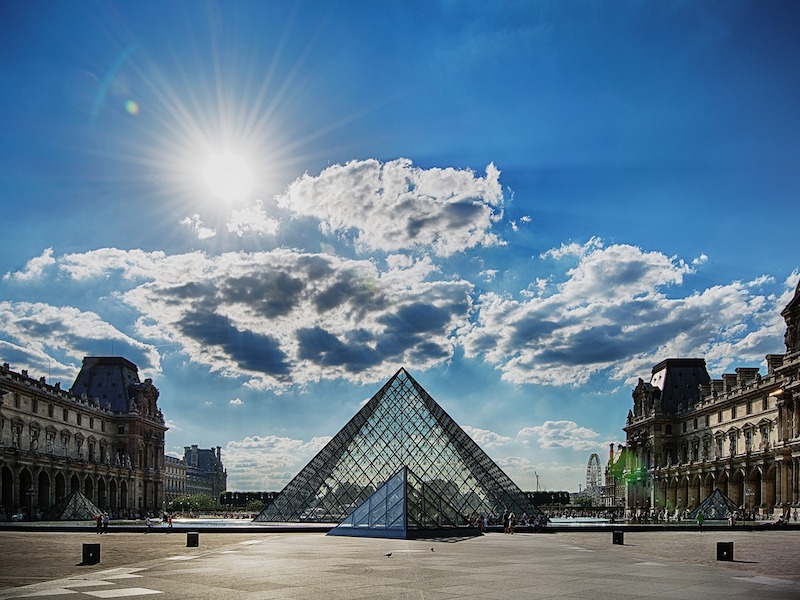

In [3]:
content_image = Image.open("Louvre.png")
print("The content image (C) shows the Louvre museum's pyramid surrounded by old Paris buildings, against a sunny sky with a few clouds.")
content_image

<a name='4-1-2'></a>
#### 4.1.2 - Content Cost Function $J_{content}(C, G)$  


In [4]:
def compute_content_cost(content_output, generated_output):
    """
    Computes the content cost

    Arguments:
    a_C -- tensor of dimension (1, n_H, n_W, n_C), hidden layer activations representing content of the image C
    a_G -- tensor of dimension (1, n_H, n_W, n_C), hidden layer activations representing content of the image G

    Returns:
    J_content -- scalar that you compute using equation 1 above.
    """
    a_C = content_output[-1]
    a_G = generated_output[-1]

    # Retrieve dimensions from a_G
    _, n_H, n_W, n_C = a_G.get_shape().as_list()

    a_C_unrolled = tf.reshape(a_C, shape=[1, n_H * n_W, n_C])
    a_G_unrolled = tf.reshape(a_G, shape=[1, n_H * n_W, n_C])

    # compute the cost with tensorflow
    J_content = 1/(4*n_H*n_W*n_C)*tf.reduce_sum(tf.square(tf.subtract(a_C_unrolled, a_G_unrolled)))



    return J_content

<a name='4-2'></a>
### 4.2 - Computing the Style Cost

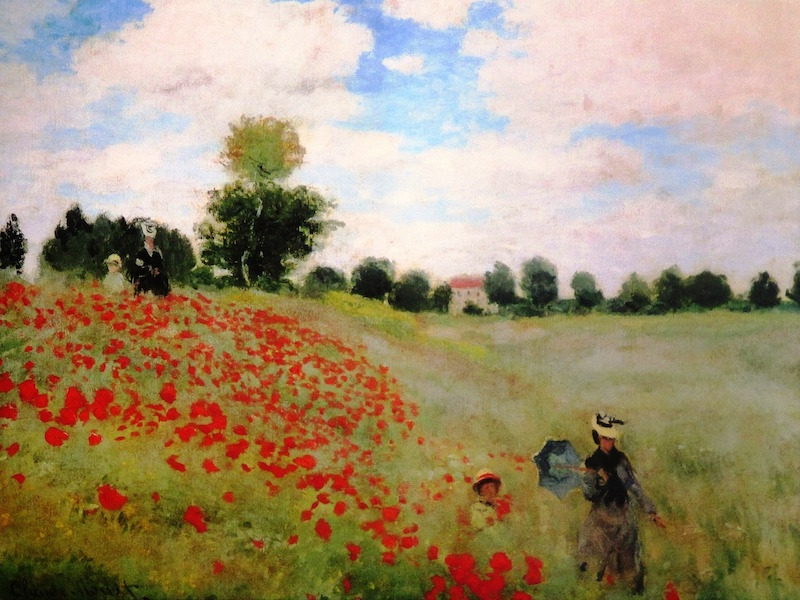

In [5]:
example = Image.open("Monet.png")
example

<a name='4-2-1'></a>
#### 4.2.1 - Style Matrix  


In [6]:
def gram_matrix(A):
    """
    Argument:
    A -- matrix of shape (n_C, n_H*n_W)

    Returns:
    GA -- Gram matrix of A, of shape (n_C, n_C)
    """
    GA = tf.linalg.matmul(A, tf.transpose(A))


    return GA

<a name='4-2-2'></a>
#### 4.2.2 - Style Cost

In [7]:
def compute_layer_style_cost(a_S, a_G):
    """
    Arguments:
    a_S -- tensor of dimension (1, n_H, n_W, n_C), hidden layer activations representing style of the image S
    a_G -- tensor of dimension (1, n_H, n_W, n_C), hidden layer activations representing style of the image G

    Returns:
    J_style_layer -- tensor representing a scalar value, style cost defined above by equation (2)
    """
    # Retrieve dimensions from a_G
    _, n_H, n_W, n_C = a_G.get_shape().as_list()

    # Reshape the tensors from (1, n_H, n_W, n_C) to (n_C, n_H * n_W)
    a_S = tf.reshape(tf.transpose(a_S), shape=[n_C, n_H * n_W])
    a_G = tf.reshape(tf.transpose(a_G), shape=[n_C, n_H * n_W])

    # Computing gram_matrices for both images S and G
    GS = gram_matrix(a_S)
    GG = gram_matrix(a_G)

    # Computing the loss
    J_style_layer = 1/(4*(n_C*n_H*n_W)**2)*tf.reduce_sum(tf.square(tf.subtract(GS, GG)))

    return J_style_layer

<a name='4-2-3'></a>  
#### 4.2.3 - Style Weights  


In [8]:
for layer in vgg.layers:
    print(layer.name)

input_layer
block1_conv1
block1_conv2
block1_pool
block2_conv1
block2_conv2
block2_pool
block3_conv1
block3_conv2
block3_conv3
block3_conv4
block3_pool
block4_conv1
block4_conv2
block4_conv3
block4_conv4
block4_pool
block5_conv1
block5_conv2
block5_conv3
block5_conv4
block5_pool


The output of the layer `block5_conv4` can now be examined. This layer will later be defined as the content layer, serving as a representation of the image.  


In [9]:
vgg.get_layer('block5_conv4').output

<KerasTensor shape=(None, 25, 25, 512), dtype=float32, sparse=False, name=keras_tensor_20>

Now choose layers to represent the style of the image and assign style costs:

In [10]:
STYLE_LAYERS = [
    ('block1_conv1', 0.2),
    ('block2_conv1', 0.2),
    ('block3_conv1', 0.2),
    ('block4_conv1', 0.2),
    ('block5_conv1', 0.2)]

In [11]:
def compute_style_cost(style_image_output, generated_image_output, STYLE_LAYERS=STYLE_LAYERS):
    """
    Computes the overall style cost from several chosen layers

    Arguments:
    style_image_output -- our tensorflow model
    generated_image_output --
    STYLE_LAYERS -- A python list containing:
                        - the names of the layers we would like to extract style from
                        - a coefficient for each of them

    Returns:
    J_style -- tensor representing a scalar value, style cost defined above by equation (2)
    """

    # initialize the overall style cost
    J_style = 0

    # Set a_S to be the hidden layer activation from the layer we have selected.
    # The last element of the array contains the content layer image, which must not be used.
    a_S = style_image_output[:-1]

    # Set a_G to be the output of the choosen hidden layers.
    # The last element of the list contains the content layer image which must not be used.
    a_G = generated_image_output[:-1]
    for i, weight in zip(range(len(a_S)), STYLE_LAYERS):
        # Compute style_cost for the current layer
        J_style_layer = compute_layer_style_cost(a_S[i], a_G[i])

        # Add weight * J_style_layer of this layer to overall style cost
        J_style += weight[1] * J_style_layer

    return J_style

<a name='4-3'></a>
### 4.3 - Defining the Total Cost to Optimize

In [12]:
@tf.function()
def total_cost(J_content, J_style, alpha = 10, beta = 40):
    """
    Computes the total cost function

    Arguments:
    J_content -- content cost coded above
    J_style -- style cost coded above
    alpha -- hyperparameter weighting the importance of the content cost
    beta -- hyperparameter weighting the importance of the style cost

    Returns:
    J -- total cost as defined by the formula above.
    """

    J = alpha*J_content + beta*J_style



    return J

<a name='5'></a>
## 5 - Solving the Optimization Problem

The complete implementation of Neural Style Transfer (NST) can now be assembled by integrating all components.  

The program will perform the following steps:  

1. Load the content image.  
2. Load the style image.  
3. Randomly initialize the image to be generated.  
4. Load the pre-trained VGG19 model.  
5. Compute the content cost.  
6. Compute the style cost.  
7. Compute the total cost.  
8. Define the optimizer and set the learning rate.  

Each of these steps will now be examined in detail.  

<a id='part(4)'></a>  


<a name='5-1'></a>
### 5.1 Load the Content Image

(1, 400, 400, 3)


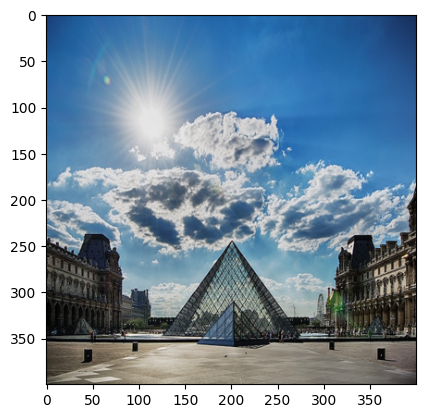

In [13]:
content_image = np.array(Image.open("Louvre.png").resize((img_size, img_size)))
content_image = tf.constant(np.reshape(content_image, ((1,) + content_image.shape)))

print(content_image.shape)
imshow(content_image[0])
plt.show()

<a name='5-2'></a>
### 5.2 Load the Style Image

(1, 400, 400, 3)


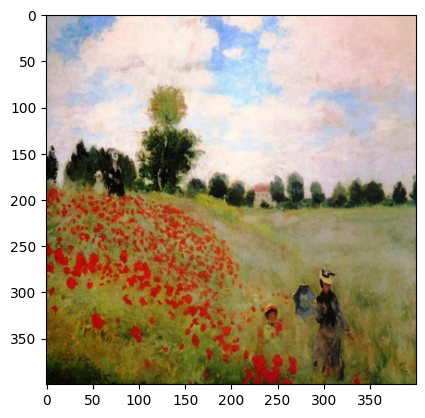

In [14]:
style_image =  np.array(Image.open("Monet.png").resize((img_size, img_size)))
style_image = tf.constant(np.reshape(style_image, ((1,) + style_image.shape)))

print(style_image.shape)
imshow(style_image[0])
plt.show()

<a name='5-3'></a>  
### 5.3 - Random Initialization of the Image to be Generated  

The "generated" image is initialized as a noisy image that shares a slight correlation with the content image.  

* The generated image is initialized to be primarily noisy, with a slight correlation to the content image.  
* This initialization strategy helps to accelerate the process of aligning the content of the generated image with the content of the reference image.  

This approach facilitates faster convergence during the optimization process.  


(1, 400, 400, 3)


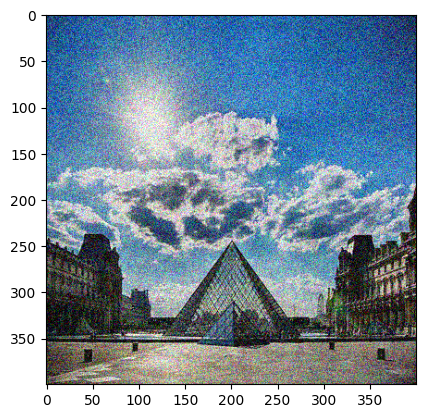

In [15]:
generated_image = tf.Variable(tf.image.convert_image_dtype(content_image, tf.float32))
noise = tf.random.uniform(tf.shape(generated_image), -0.25, 0.25)
generated_image = tf.add(generated_image, noise)
generated_image = tf.clip_by_value(generated_image, clip_value_min=0.0, clip_value_max=1.0)

print(generated_image.shape)
imshow(generated_image.numpy()[0])
plt.show()

<a name='5-4'></a>
### 5.4 - Load Pre-trained VGG19 Model

In [16]:
def get_layer_outputs(vgg, layer_names):
    """ Creates a vgg model that returns a list of intermediate output values."""
    outputs = [vgg.get_layer(layer[0]).output for layer in layer_names]

    model = tf.keras.Model([vgg.input], outputs)
    return model

Now, define the content layer and build the model.

In [17]:
content_layer = [('block5_conv4', 1)]

vgg_model_outputs = get_layer_outputs(vgg, STYLE_LAYERS + content_layer)

Save the outputs for the content and style layers in separate variables.

In [18]:
content_target = vgg_model_outputs(content_image)  # Content encoder
style_targets = vgg_model_outputs(style_image)     # Style encoder

<a name='5-5'></a>  
### 5.5 - Compute Total Cost  

<a name='5-5-1'></a>  
#### 5.5.1 - Compute the Content Image Encoding ($a_C$)  


In [19]:
# Assign the content image to be the input of the VGG model.
# Set a_C to be the hidden layer activation from the layer we have selected
preprocessed_content =  tf.Variable(tf.image.convert_image_dtype(content_image, tf.float32))
a_C = vgg_model_outputs(preprocessed_content)

<a name='5-5-2'></a>
#### 5.5.2 - Compute the Style image Encoding (a_S)


In [20]:
# Assign the input of the model to be the "style" image
preprocessed_style =  tf.Variable(tf.image.convert_image_dtype(style_image, tf.float32))
a_S = vgg_model_outputs(preprocessed_style)

Below are the utils that will be needed to display the images generated by the style transfer model.

In [21]:
def clip_0_1(image):
    """
    Truncate all the pixels in the tensor to be between 0 and 1

    Arguments:
    image -- Tensor
    J_style -- style cost coded above

    Returns:
    Tensor
    """
    return tf.clip_by_value(image, clip_value_min=0.0, clip_value_max=1.0)

def tensor_to_image(tensor):
    """
    Converts the given tensor into a PIL image

    Arguments:
    tensor -- Tensor

    Returns:
    Image: A PIL image
    """
    tensor = tensor * 255
    tensor = np.array(tensor, dtype=np.uint8)
    if np.ndim(tensor) > 3:
        assert tensor.shape[0] == 1
        tensor = tensor[0]
    return Image.fromarray(tensor)

In [22]:
# Ensure generated_image is a tf.Variable
optimizer = tf.keras.optimizers.Adam(learning_rate=0.01)

# Initialize generated_image as a tf.Variable outside train_step
generated_image = tf.Variable(generated_image)

def train_step(generated_image):
    if not isinstance(generated_image, tf.Variable):
        generated_image = tf.Variable(generated_image)

    with tf.GradientTape() as tape:
        # Compute a_G as the VGG model outputs for the current generated image
        a_G = vgg_model_outputs(generated_image)

        # Compute the style cost
        J_style = compute_style_cost(a_S, a_G, STYLE_LAYERS)

        # Compute the content cost
        J_content = compute_content_cost(a_C, a_G)

        # Compute the total cost
        J = total_cost(J_content, J_style)

    # Compute gradients
    grad = tape.gradient(J, generated_image)

    # Apply gradients
    optimizer.apply_gradients([(grad, generated_image)])

    # Clip the values of the image to maintain pixel range [0, 1]
    generated_image.assign(clip_0_1(generated_image))

    # Return the total cost for monitoring
    return J


<a name='5-6'></a>  
### 5.6 - Train the Model  

Execute the following cell to generate an artistic image. This process typically takes around 3 minutes on a GPU for 2500 iterations. Neural Style Transfer is generally optimized using GPUs for improved performance.  

Increasing the learning rate can accelerate the style transfer process, although it may reduce the overall quality of the generated image.  


Num GPUs Available:  1
Epoch 0 


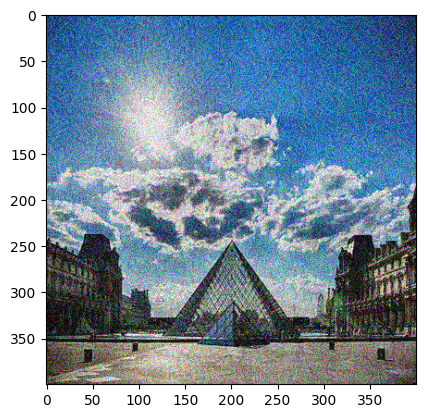

Epoch 250 


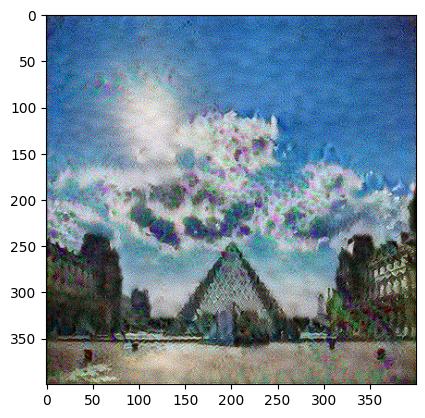

Epoch 500 


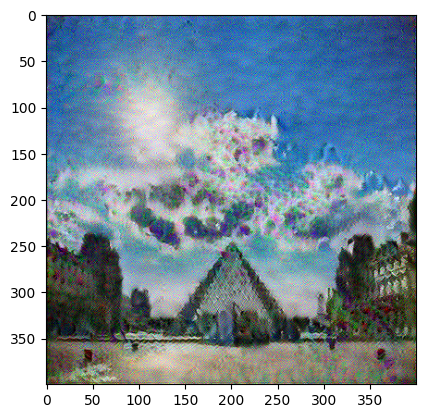

Epoch 750 


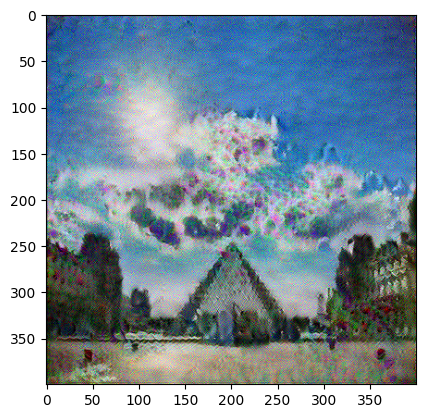

Epoch 1000 


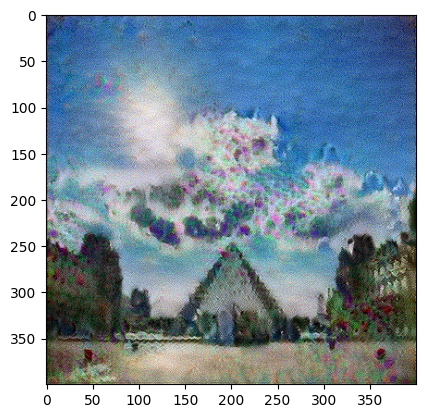

Epoch 1250 


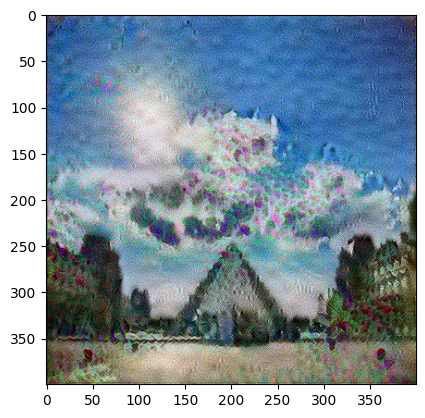

Epoch 1500 


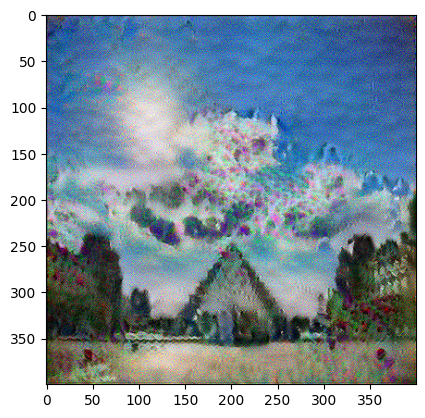

Epoch 1750 


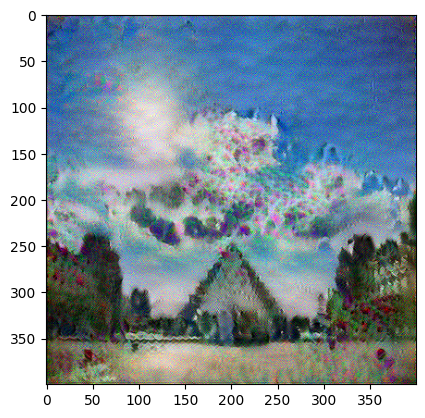

Epoch 2000 


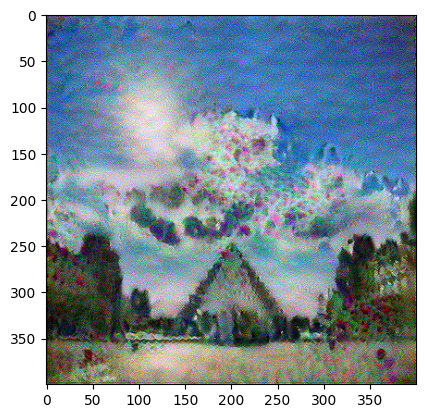

Epoch 2250 


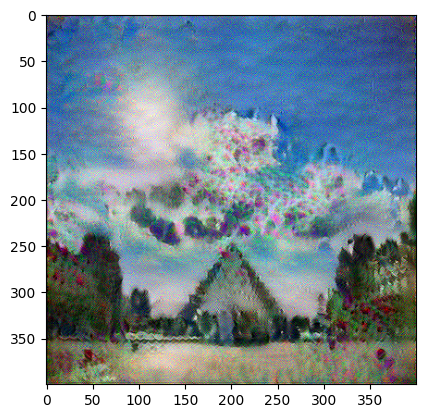

Epoch 2500 


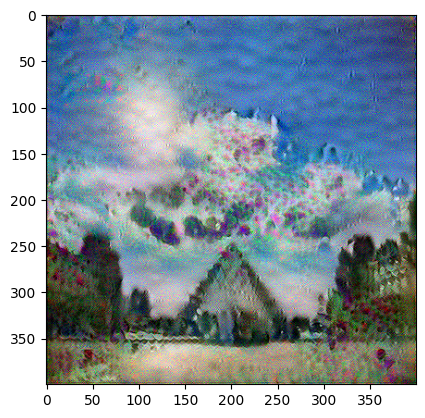

In [23]:
import tensorflow as tf

# Check if GPU is available
print("Num GPUs Available: ", len(tf.config.experimental.list_physical_devices('GPU')))

# Ensure that the training is done on the GPU
with tf.device('/GPU:0'):
    # Show the generated image at some epochs
    epochs = 2501
    for i in range(epochs):
        train_step(generated_image)
        if i % 250 == 0:
            print(f"Epoch {i} ")
        if i % 250 == 0:
            image = tensor_to_image(generated_image)
            imshow(image)
            # image.save(f"output/image_{i}.jpg")
            plt.show()

Now, run the following code cell to see the results!

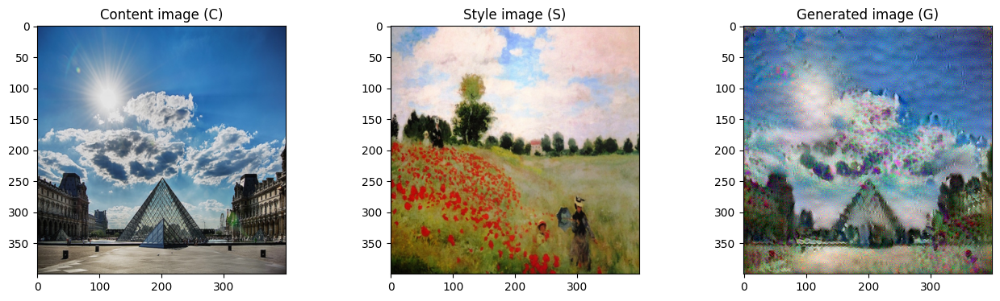

In [24]:
# Show the 3 images in a row
fig = plt.figure(figsize=(16, 4))
ax = fig.add_subplot(1, 3, 1)
imshow(content_image[0])
ax.title.set_text('Content image (C)')
ax = fig.add_subplot(1, 3, 2)
imshow(style_image[0])
ax.title.set_text('Style image (S)')
ax = fig.add_subplot(1, 3, 3)
imshow(generated_image[0])
ax.title.set_text('Generated image (G)')
plt.show()